# CA2: Data Preparation & Machine Learning


> **Lucas de Sousa Pontes**

> **Data Preparation & Machine Learning**


# Introduction

    The Shill Bidding Dataset comprise eBay auctions with many different features, including the duration of the auctions, bidder tendency and class, among others (Alzahrani and Sadaoui, 2018). The aim of this report is to submit the data to different supervised and unsupervised machine learning methods after properly characterisation and preparation of the dataset. To achieve the best result stand scaler will be applied and compared alongside feature reduction methods, machine-learning methods applied will also have the performance and accuracy level measured and compared. At the end of this report, the supervised and  unsupervised methods will be identified in order to work with optimal performance in the Shill Bidding Dataset. The predictions related to normal and abnormal bidding behaviour of eBay users may help companies to identify scams and other undesirable users within the platform.

# Data preparation

## Data characterisation

    Data characterisation is defined as the pre-processing phase of summarization of the different features and characteristics presents in the observations of a given data set, this process may be accomplished by introducing the data to the viewer using statistics measure summaries, and presenting visually using graphs, like bar charts and scatter plots (Capozzoli, Cerquitelli and Piscitelli, 2016; Han, Kamber and Pei, 2012).  

In [1]:
#Loading the data
import pandas as pd
import numpy as np
SBD = pd.read_csv("Shill Bidding Dataset.csv")

In [2]:
#A glimpse at the first 5 rows of the SBD data
SBD.head()

,Record_ID,Auction_ID,Bidder_ID,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
0,1,732,_***i,0.200000,0.400000,0.0,0.000028,0.0,0.993593,0.000028,0.666667,5,0
1,2,732,g***r,0.024390,0.200000,0.0,0.013123,0.0,0.993593,0.013123,0.944444,5,0
2,3,732,t***p,0.142857,0.200000,0.0,0.003042,0.0,0.993593,0.003042,1.000000,5,0
3,4,732,7***n,0.100000,0.200000,0.0,0.097477,0.0,0.993593,0.097477,1.000000,5,0
4,5,900,z***z,0.051282,0.222222,0.0,0.001318,0.0,0.000000,0.001242,0.500000,7,0


In [3]:
# Data dimensionality, observations and features, respectively
SBD.shape

(6321, 13)

In [4]:
# Checking for null values and columns type 
SBD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6321 entries, 0 to 6320
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Record_ID               6321 non-null   int64  
 1   Auction_ID              6321 non-null   int64  
 2   Bidder_ID               6321 non-null   object 
 3   Bidder_Tendency         6321 non-null   float64
 4   Bidding_Ratio           6321 non-null   float64
 5   Successive_Outbidding   6321 non-null   float64
 6   Last_Bidding            6321 non-null   float64
 7   Auction_Bids            6321 non-null   float64
 8   Starting_Price_Average  6321 non-null   float64
 9   Early_Bidding           6321 non-null   float64
 10  Winning_Ratio           6321 non-null   float64
 11  Auction_Duration        6321 non-null   int64  
 12  Class                   6321 non-null   int64  
dtypes: float64(8), int64(4), object(1)
memory usage: 642.1+ KB


In [5]:
# Descriptive statistics for the numerical features
SBD.describe()

,Record_ID,Auction_ID,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Last_Bidding,Auction_Bids,Starting_Price_Average,Early_Bidding,Winning_Ratio,Auction_Duration,Class
count,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000,6321.000000
mean,7535.829457,1241.388230,0.142541,0.127670,0.103781,0.463119,0.231606,0.472821,0.430683,0.367731,4.615093,0.106787
std,4364.759137,735.770789,0.197084,0.131530,0.279698,0.380097,0.255252,0.489912,0.380785,0.436573,2.466629,0.308867
min,1.000000,5.000000,0.000000,0.011765,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,3778.000000,589.000000,0.027027,0.043478,0.000000,0.047928,0.000000,0.000000,0.026620,0.000000,3.000000,0.000000
50%,7591.000000,1246.000000,0.062500,0.083333,0.000000,0.440937,0.142857,0.000000,0.360104,0.000000,5.000000,0.000000
75%,11277.000000,1867.000000,0.166667,0.166667,0.000000,0.860363,0.454545,0.993593,0.826761,0.851852,7.000000,0.000000
max,15144.000000,2538.000000,1.000000,1.000000,1.000000,0.999900,0.788235,0.999935,0.999900,1.000000,10.000000,1.000000


In [6]:
# Pandas profiling displays a generalized data characterisation report
import pandas_profiling as pp
pp.ProfileReport(SBD)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

    A first glance at the data shows 6321 observations for 13 features, being 9 numeric and 4 categorical, without any infinity or standard missing values. Pandas Profiling general data characterisation analysis displays that not only the categorical, but the majority of the numerical features, like Auction Bids, Starting Price, and the Winning ratio also contain a small number of distinct values.

In [7]:
# Visualization Imports
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
get_ipython().run_line_magic('matplotlib', 'inline')
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px
import numpy as np


In [8]:
# Pie Chart for bidding behaviour
dist = SBD['Class'].value_counts()
colors = ['mediumturquoise', 'darkorange']
trace = go.Pie(values=(np.array(dist)),labels=dist.index)
layout = go.Layout(title='Bidding behavior')
data = [trace]
fig = go.Figure(trace,layout)
fig.update_traces(marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.show()

    As shown in the interactive pie chart above, only 10.7% (675 observations) of the biddings are considered not normal. The graph above does a great job showing the proportion because it also includes the numerical values on it. However, pie charts are not recommended to display proportion, especially when the feature contains multiple unique observations or small fractions, Human perception does not comprehend angular proportions in pie charts as it should (Hunt, 2019).

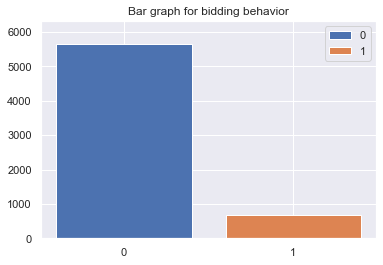

In [9]:
#Bar chart for bidding behavior
sns.set(style="darkgrid")
labels = []
for i, SBDi in enumerate(SBD.groupby(["Class"])):
    labels.append(SBDi[0])
    plt.bar(i, SBDi[1].count(), label=SBDi[0])
plt.title("Bar graph for bidding behavior")
plt.xticks(range(len(labels)), labels)
plt.legend()
plt.ylim(0,6321)
plt.show()

    Bar chart proportions are more lucid, by setting the y axis to the total number of observations, the blank space over the first bar corresponds exactly to the proportion of abnormal observations, also represented in the orange bar.

In [10]:
def df_to_plotly(SBD):
    return {'z': SBD.values.tolist(),
            'x': SBD.columns.tolist(),
            'y': SBD.index.tolist() }
import plotly.graph_objects as go
dfNew = SBD.corr()
fig = go.Figure(data=go.Heatmap(df_to_plotly(dfNew)))
fig.show()

    The heatmap above, like the one created by panda profiling, shows the correlation between all numerical features in a single graph. The problem with heat maps is that slight colour intensity variations can be hard to perceive by human eyes, especially with certain colour combinations. Approximately 8% of men and 0.5% of women have a form of colourblindness, the colour scale chosen should consider these individuals (BioTuring’s Blog, 2018; Colour Blind Awareness, n.d.). The advantage of the plotly graph above is the interactiveness, allowing the viewer to check the exact correlation between the variables by putting the mouse over the corresponding square, as an example, the positive correlation between early and last bidding features is notorious. Another noticeable correlation is the negative one between the winning ratio and auction bids, for further investigation, both will be displayed in a scatter plot.

In [11]:
fig = px.scatter(SBD, x='Early_Bidding', y='Last_Bidding')
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Correlation between Early Bidding and Last Bidding')
fig.show()

    The scatter plot makes it noticeable why those two variables are so positive correlated, considering that the last bidding value can never be lower than the early bidding value. A positive slope can be found in the diagonal centre of the 2-dimensional plot, this line represents the values which were the same in both features.

In [12]:
fig = px.scatter(SBD, x='Winning_Ratio', y='Auction_Bids')
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Correlation between winning ratio and auction bids')
fig.show()

    Different from the previous scatter plot, this time the features auction bids and winning ratio, which had a negative correlation in the heatmap representation, do not show any visible correlation. This interaction will be later tested when used as a predictor in a linear regression method.  

Text(0.5, 1.0, 'Record ID distribution')

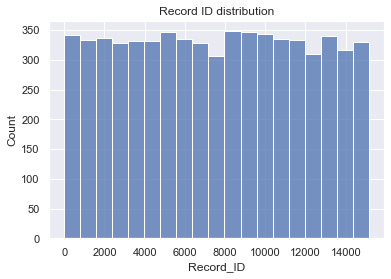

In [13]:
p = sns.histplot(data=SBD["Record_ID"])
p.set_title('Record ID distribution')

Text(0.5, 1.0, 'Auction ID distribution')

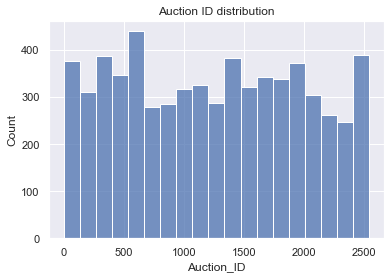

In [14]:

p = sns.histplot(data=SBD["Auction_ID"])
p.set_title('Auction ID distribution')


    The histograms above display a clear difference between the distribution of the Auction and Record ID, as the x-axis of the Auction ID, is much shorter, this happens because many auctions are represented in the data set multiple times. Also, the Record ID is uniform, even so not perfectly uniform, representing the absence of multiple observations with the same ID. The Pandas Profiling analysis already displayed that information, accompanied by the distinct values as additional information, which is 100% for the Record ID and 12.8% for the action ID, confirming the histogram findings previously discussed.

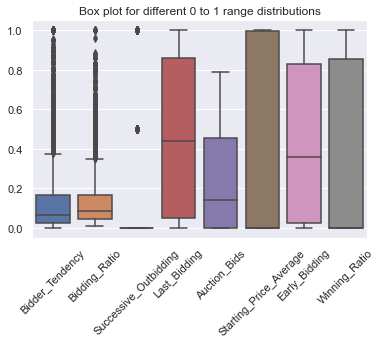

In [15]:
sns.set(style="darkgrid")

sns.boxplot(data=SBD.iloc[:, 2:11])
plt.title("Box plot for different 0 to 1 range distributions")
plt.xticks(rotation=45)
plt.show()

    The Boxplot above shows the distribution of several numerical features with a range between 0 and 1. These 8 features were chosen to be represented by grouped boxplots since it is an exceptional alternative to viewing many distributions in a single graph, especially if the y-axis range matches all features. This figure is extremely informative, considering that it displays the distribution of the observations, the quartile range including the median, and the minimum and maximum values, which describe the range (Galarnyk, 2018).

Text(0.5, 1.0, 'Auction Duration distribution')

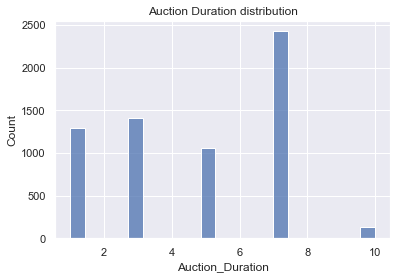

In [16]:
p = sns.histplot(data=SBD["Auction_Duration"])
p.set_title('Auction Duration distribution')


    Although is a numerical feature, the low number of distinct values causes the histogram to not be aesthetically pleasing, however, it shows the 5 distinct values 7,3,1,5 and 10 and how many times each one appeared in the auction duration column. This pattern suggests five fixed auction durations options that the platform allows the sellers to choose from.

In [17]:
pd.pivot_table(SBD, index = 'Class', values = ['Bidder_Tendency','Bidding_Ratio','Successive_Outbidding',
                                               'Last_Bidding',"Auction_Bids", "Starting_Price_Average", "Early_Bidding",
                                              "Winning_Ratio", "Auction_Duration"])

,Auction_Bids,Auction_Duration,Bidder_Tendency,Bidding_Ratio,Early_Bidding,Last_Bidding,Starting_Price_Average,Successive_Outbidding,Winning_Ratio
Class,,,,,,,,,
0,0.227638,4.597060,0.122403,0.101775,0.423630,0.450286,0.465605,0.016649,0.308242
1,0.264797,4.765926,0.310979,0.344268,0.489674,0.570463,0.533181,0.832593,0.865322


    The pivot table above points to a substantial difference in the mean value for most features when compared to normal and abnormal bidding patterns. This information is important since the class feature will be the dependable variable for machine learning models in the next steps.

## Data cleaning

    The importance of identifying and removing missing values from the data prior to modelling is that it can reduce its accuracy and cause bias in the analysis (Analytics Vidhya, 2021). As shown in the pandas profiling report, there is not a single missing value in the data. However, sometimes the missing values appear as non-standard, a different format that includes strings named "NA", "n/a", "--" and many other possibilities. Unfortunately, it is near-impossible to check for all of them, especially in datasets with numerous observations and features. When it happens the feature type can only be categorical, since 0 in numeric features should not be considered meaningless (Sullivan, 2018). 

In [18]:
SBD.isnull().values.any()

False

In [19]:
SBD['Bidder_ID'].value_counts().head(50)

a***a    112
n***t     85
e***e     67
i***a     50
r***r     49
l***l     48
o***o     45
i***i     44
r***h     43
r***a     41
a***k     37
n***i     36
a***m     35
a***o     33
s***s     33
a***i     32
r***e     31
1***1     31
b***b     31
s***a     31
m***m     31
s***n     31
a***n     30
a***t     30
a***l     30
0***e     29
t***n     28
l***a     28
s***i     28
e***a     27
m***a     27
o***a     26
t***e     26
a***s     26
l***e     25
a***r     25
s***e     25
n***n     24
i***r     24
d***a     24
a***u     23
e***r     23
o***t     23
n***e     23
g***a     22
i***l     22
l***i     22
8***a     22
0***0     22
o***l     21
Name: Bidder_ID, dtype: int64

In [20]:
SBD['Bidder_ID'].value_counts().tail(50)

j***k    1
m***2    1
y***8    1
o***k    1
t***6    1
4***5    1
6***p    1
3***n    1
o***f    1
l***5    1
q***3    1
-***w    1
d***_    1
4***c    1
4***n    1
-***d    1
b***4    1
p***f    1
u***-    1
s***7    1
1***b    1
6***h    1
n***5    1
x***b    1
2***d    1
7***.    1
q***l    1
u***y    1
k***w    1
_***u    1
.***0    1
0***p    1
x***w    1
u***7    1
5***n    1
5***7    1
_***d    1
q***t    1
1***v    1
_***y    1
p***s    1
c***.    1
e***w    1
4***r    1
h***p    1
n***y    1
u***z    1
t***9    1
z***b    1
9***7    1
Name: Bidder_ID, dtype: int64

    Taking a look at the features "Bidder_ID" seems like the only one that is suitable for the presence of non-standard missing values, due to the high amount of distinct values. Many bidder's ID appears in multiple instances since the same user can bid in different auctions and multiple times in the same auction. Checking the 50 most and least common IDs, no non-standard missing values is observed, the next step should be checking for common strings associated with this kind of value.


In [21]:
missing_values = ["n/a", "na", "--"]
SBD_NA = pd.read_csv("Shill Bidding Dataset.csv", na_values = missing_values)

In [22]:
SBD_NA.isnull().values.any()

False

    The analysis above indicate the absence of standard and non-standad missing values.

## Feature engineering

    As an important stage preceding the machine learning modelling, this task requires the judgement of the data analyst and numerous trials and errors. Feature engineering is the act of transforming a given feature space with different tools, especially mathematical, with the main goal of improving the model performance (Khurana, Samulowitz and Turaga, 2018).

    The first step will be removing unnecessary columns for the future tasks, the first three columns only include the IDs for the record, auction and bidder respectively and do not add any significance to the modelling.

In [23]:
df = SBD.drop(columns =["Record_ID", "Auction_ID", "Bidder_ID"])

    As observed by the correlation of early and last biding in the scatter plot, the early bidding can never exceed the last bidding in value, however,  what eventually happens is that the auction has no increase in price and culminate in the same value. To join the information of the two columns in one and add extra information to the future predictive model,  a new column named "Bidding difference" will substitute them with the existing incremented value calculated by the difference between their prices.

In [24]:
df["Bidding difference"] = df['Last_Bidding'] - df['Early_Bidding']
df = df.drop(columns =['Last_Bidding', 'Early_Bidding'])

In [25]:
df.sort_values( by="Bidding difference",ascending=True).head(26)

,Bidder_Tendency,Bidding_Ratio,Successive_Outbidding,Auction_Bids,Starting_Price_Average,Winning_Ratio,Auction_Duration,Class,Bidding difference
905,0.008403,0.052632,0.0,0.052632,0.000000,0.000000,7,0,-1.000000e-10
3929,0.000000,0.043478,0.0,0.217391,0.993593,0.000000,3,0,-1.000000e-10
5915,0.500000,0.023256,0.0,0.581395,0.993528,0.000000,3,0,-1.000000e-10
2041,0.100000,0.047619,0.0,0.142857,0.000000,0.000000,3,0,-1.000000e-10
1146,0.031250,0.019608,0.0,0.647059,0.993593,0.000000,3,0,-1.000000e-10
2164,0.008197,0.040000,0.0,0.280000,0.993593,0.000000,7,0,-1.000000e-10
2165,0.025000,0.040000,0.0,0.280000,0.993593,0.000000,7,0,-1.000000e-10
2169,0.200000,0.028571,0.0,0.485714,0.993593,0.000000,3,0,-1.000000e-10
4916,0.022727,0.071429,0.0,0.000000,0.000000,0.000000,3,0,-1.000000e-10
5021,0.166667,0.166667,0.0,0.000000,0.000000,0.666667,3,0,-1.000000e-10


    Calculating the difference between last and early bidding resulted in a feature with 25 negative values unexpected, suggesting that in these 25 observations the trade was concluded with the last bidding having a lower value than the early bidding, which is counterintuitive.

## Data scaling

    The different orders of magnitude present in the data, as seen in the data characterisation section, bias the results since most machine learning algorithms calculate the output using euclidean distance (Asaithambi, 2017). As seen in the distribution of the previous boxplots and histograms the numeric features contain some outliers, considering the putative relevance of these outliers in the machine learning analysis, the ideal transformation method will maintain the impact of these feature outliers in the output of the machine learning algorithm to be performed. The two regularly used scaling methods are  standardization and normalization, for this dataset the standardization  will be applied as the transformation method of choice, since it copes better with outliers than normalization methods (GeeksforGeeks, 2020).

In [26]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

    As observed above, except for a few negative values in the Bidding difference column, all features range from 0 to 1. Data scaling is necessary when the features of a dataset have a different range or order of magnitude (Roy, 2020), both conditions have not been met as displayed by the pandas profiling report, taking that into consideration the data scaling is may not necessary for that instance. However, to evaluate that, the "X_s" variable will contain that scaled data to be compared to the not-scaled data.

In [27]:
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()
target = df[['Bidder_Tendency', 'Bidding_Ratio', "Successive_Outbidding","Auction_Bids",
        "Starting_Price_Average", "Winning_Ratio","Auction_Duration","Bidding difference"]]
X_s = scale.fit_transform(target) 

    The scaled variables are going to be had their performance measured in the feature reducing methods and the Random Forest Classification machine learning method to come, after the comparison, the one with better predictive power will be applied in the following tasks.

## Linear Discriminant Analysis (LDA)

    In pattern classification using a Machine Learning algorithm, the training vectors are evaluated by comparing them to the test split, a common problem that can reduce its accuracy is the large dimensionality of the data, and numerous features reducing the robustness of the pattern classifiers. 
    Linear discriminant analysis or LDA is a supervised technique that generally exceeds other techniques when applied to feature classification, LDA method reduces the number of features that fit in the different classes prior to classification while maintaining the classes well separated in this lower dimensional space (Sharma and Paliwal, 2014).

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis 
from sklearn import datasets
X = df[['Bidder_Tendency', 'Bidding_Ratio', "Successive_Outbidding","Auction_Bids",
        "Starting_Price_Average", "Winning_Ratio","Auction_Duration","Bidding difference"]]
y = df['Class']

#Fit the LDA model
lda = LinearDiscriminantAnalysis()
X_r2 = lda.fit(X, y).transform(X)

    The X and y variables will be recurrently used in the subsequent implemented models, capital x represents all columns used to make the prediction in our dependable variable or feature interest "y", which contains the values 0 and 1 representing normal and abnormal bidding behaviour respectively (Brownlee, 2020). In the sequence, the code above also fit the linear discriminant analysis model to our recently created X and y variables.

In [29]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

scores = cross_val_score(lda, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
print(np.mean(scores))   

0.9727898927483485


    After fitting the model, the next step should be to evaluate it, as observed the model performed a mean accuracy of over 97%, which is an exceptional value. This accuracy can be put to test using the "predict" function (Zach, 2020). 

In [30]:
pred = [0.100000, 0.206897, 0.0, 0.379310, 0.999935, 0.866667, 5, 0]
lda.predict([pred])

array([0], dtype=int64)

In [31]:
pred = [0.100000, 0.206897, 1.0, 0.379310, 0.999935, 0.866667, 5, 0]
lda.predict([pred])

array([1], dtype=int64)

    Using the set of values above, two predictions were made with a single difference, when the bidder does successive outbidding, as indicated by the value 1 in the "successive outbidding" column, the prediction change to abnormal bidding behaviour compared to biddings that does not follow this pattern, as predicted above (Zach, 2020).

In [32]:
lda = LinearDiscriminantAnalysis()
X_r2_s = lda.fit(X_s, y).transform(X_s)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

scores = cross_val_score(lda, X_s, y, scoring='accuracy', cv=cv, n_jobs=-1)
print(np.mean(scores)) 

0.9727898927483485


In [33]:
pred = [0.100000, 0.206897, 0.0, 0.379310, 0.999935, 0.866667, 5, 0]
lda.predict([pred])

array([0], dtype=int64)

In [34]:
pred = [0.100000, 0.206897, 1.0, 0.379310, 0.999935, 0.866667, 5, 0]
lda.predict([pred])

array([0], dtype=int64)

    The scaled data had the same performance when compared to the non-scaled, however, the prediction was different for the same set of values used in the "predict" function.

## Principal Component Analysis (PCA)

    Another technique used to approach the high-dimensionality problem is the principal component analysis or PCA, which different from LDA, is an unsupervised technique that ignores class labels. The main objective of performing a PCA prior to the Machine Learning technique is to increase interpretability while preserving statistical information (Jolliffe and Cadima, 2016).

In [35]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
X_r = pca.fit(X).transform(X)
print("Shape of X", X.shape)
print("Shape of transformed X", X_r.shape)

Shape of X (6321, 8)
Shape of transformed X (6321, 3)


    The original data has 8 columns after fitting the principal component analysis the code projects the data into 2 dimensions (Galarnyk, 2017).

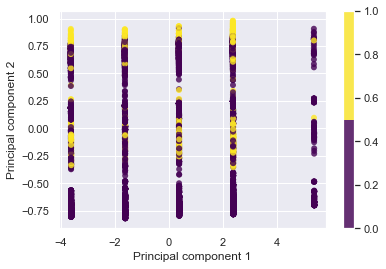

In [36]:
x1 = X_r[:,0]
x2 = X_r[:,1]
plt.scatter(x1,x2,
           c=y, edgecolor = "none", alpha = 0.8, 
           cmap = plt.cm.get_cmap("viridis", 2))
plt.xlabel("Principal component 1")
plt.ylabel("Principal component 2")
plt.colorbar()
plt.show()

    The unscaled data have an off-centre behaviour, the two classes are now well separated and it is hard to perceive a pattern.

In [37]:
X_r_s = pca.fit(X_s).transform(X_s)
print("Shape of X", X_s.shape)
print("Shape of transformed X", X_r_s.shape)

Shape of X (6321, 8)
Shape of transformed X (6321, 3)


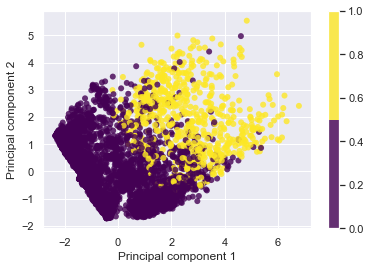

In [38]:
x1 = X_r_s[:,0]
x2 = X_r_s[:,1]
plt.scatter(x1,x2,
           c=y, edgecolor = "none", alpha = 0.8, 
           cmap = plt.cm.get_cmap("viridis", 2))
plt.xlabel("Principal component 1")
plt.ylabel("Principal component 2")
plt.colorbar()
plt.show()

    In contrast, the scaled data seems well-distributed and the classes are well separated is easy to discern from each other.

## LDA and PCA comparison

    The goal of this section, complemented with the random forest classification section, is to display and discuss the differences between the methods and their findings in both scaled and unscaled data. The main distinction between these two methods is that LDA is supervised, requiring labelled inputs, while PCA is unsupervised, ignoring class labels. LDA basis on discovering the feature subspace of highest separability between classes, while PCA focus in reproduce the topmost direction of variation in the features, the first component (PC1) accounting for the highest variation and the PC2 the second-best and so forth (Duvva, 2021).


explained variance ratio (first two components): [0.90433183 0.04681103 0.02728926]


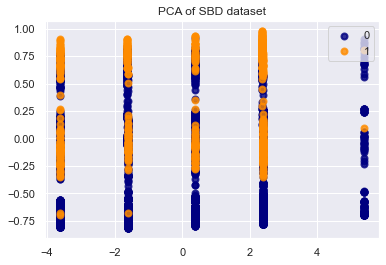

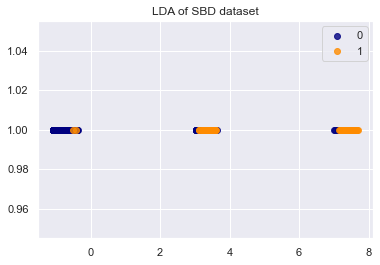

In [39]:
# Percentage of variance explained for each components
target_names = np.unique(y)
X_r = pca.fit(X).transform(X)
print(
    "explained variance ratio (first two components): %s"
    % str(pca.explained_variance_ratio_)
)

plt.figure()
colors = ["navy", "darkorange"]
lw = 2

for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(
        X_r[y == i, 0], X_r[y == i, 1], color=color, alpha=0.8, lw=lw, label=target_name
    )
plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("PCA of SBD dataset")

plt.figure()
for color, i, target_name in zip(colors, [0, 1, 2], target_names):
   plt.scatter(
        X_r2[y == i, 0], np.ones_like(X_r2[y == i, 0]), alpha=0.8, color=color, label=target_name, 
    )  

plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("LDA of SBD dataset")

plt.show()

     Just the first component explains over 90% of the variation, but the distribution of the classes is not well separated, as shown before. Since the data only contains 2 unique classes, normal and abnormal bidding behaviour, the linear discriminant analysis contains only 1 dimension, which only allows the data to be plotted on a single axis. According to sklearn linear discriminant analysis documentation, the transformation process has a minimum number of features equal to the number of classes minus one, which resulted in a single feature (scikit-learn.org, n.d.).

explained variance ratio (first two components) for the scaled data: [0.32046685 0.20885665 0.12454206]


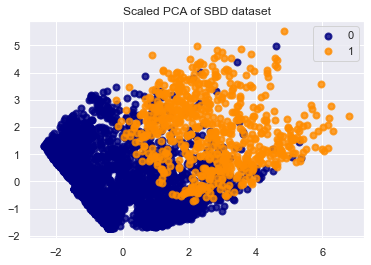

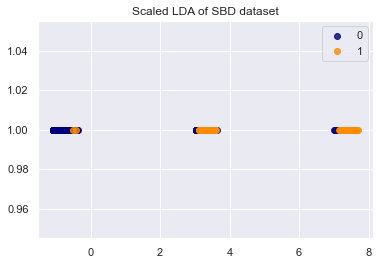

In [40]:
target_names = np.unique(y)
X_r_s = pca.fit(X_s).transform(X_s)
print(
    "explained variance ratio (first two components) for the scaled data: %s"
    % str(pca.explained_variance_ratio_)
)

plt.figure()
colors = ["navy", "darkorange"]
lw = 2

for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(
        X_r_s[y == i, 0], X_r_s[y == i, 1], color=color, alpha=0.8, lw=lw, label=target_name
    )
plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("Scaled PCA of SBD dataset")

plt.figure()
for color, i, target_name in zip(colors, [0, 1, 2], target_names):
   plt.scatter(
        X_r2_s[y == i, 0], np.ones_like(X_r2_s[y == i, 0]), alpha=0.8, color=color, label=target_name, 
    )  

plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("Scaled LDA of SBD dataset")

plt.show()

    The PCA with the scaled data has reduced variance explanation for the first 2 components compared to the unscaled data, however, the distribution of classes is easier to discern and acknowledge. The way that the classes are being displayed themselves suggests PCA as a better choice for the dimensionality reduction method, to examine this possibility the next step will be to make predictions using both methods and validate it.

# Machine Learning

    The concept of Machine Learning is a measurable improvement in a computer program's function as its performance improves as it is presented with more data. Machine Learning algorithm are built to handle three different types of task, clustering, regression and classification. To solve these tasks the analyst has to decide using his experience the appropriate method to select between reinforcement learning, supervised learning, unsupervised learning, and semi-supervised learning, considering that each method is pertinent to different types of data (Ray, 2019).

# Classification algorithms

    Applied in both structured and unstructured data, classification algorithms aim is to learn from training data in order to label new data into a specific class (Sen, Hajra and Ghosh, 2019).

## Random Forest Classification

    The Random Forest Classification technique can be applied in both regression and classification, this supervised learning methodology performs well with numerous and imbalanced datasets, dealing with missing data efficiently (More and Rana, 2017).

In [41]:
#Raw data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_raw = accuracy_score(y_test, y_pred)

[[1118   23]
 [   9  115]]
0.974703557312253


    The data will be split into an 80% training, and 20% test split, this is the most common split of data considered one of the best ranges to avoid overfitting (Askpython, 2020). For unambiguous comparison, the same split ratio will be kept for this and every other supervised method applied. The non-transformed data, which will be identified as raw, fitted in the random forest classifier method has an accuracy greater than 97%, which is extremely good, however, some factors should be considered, this can be due to overfitting, which will be investigated using the classification_report function. Also not every good and precise models perform as accurate in real-world scenarios (Kumar, 2020). The same code above will be adapted and applied to the scaled and unscaled data, including the data transformed by the PCA and LDA methods, and the results compared.

In [42]:
#Raw scaled data
X_train, X_test, y_train, y_test = train_test_split(X_s, y, test_size=0.2, random_state=0)
classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_raw_s = accuracy_score(y_test, y_pred)

[[1118   23]
 [   9  115]]
0.974703557312253


In [43]:
#PCA data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_pca = accuracy_score(y_test, y_pred)

[[1141    0]
 [ 107   17]]
0.9154150197628459


In [44]:
#PCA scaled data
X_train, X_test, y_train, y_test = train_test_split(X_s, y, test_size=0.2, random_state=0)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_pca_s = accuracy_score(y_test, y_pred)

[[1138    3]
 [  82   42]]
0.932806324110672


In [45]:
#LDA data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train= lda.fit(X_train, y_train).transform(X_train)
X_test = lda.fit(X_test, y_test).transform(X_test)

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_lda = accuracy_score(y_test, y_pred)

[[1114   27]
 [   1  123]]
0.9778656126482214


In [46]:
#LDA scaled data
X_train, X_test, y_train, y_test = train_test_split(X_s, y, test_size=0.2, random_state=0)

X_train= lda.fit(X_train, y_train).transform(X_train)
X_test = lda.fit(X_test, y_test).transform(X_test)

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
acc_lda_s = accuracy_score(y_test, y_pred)

[[1114   27]
 [   1  123]]
0.9778656126482214


In [47]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      1141
           1       0.82      0.99      0.90       124

    accuracy                           0.98      1265
   macro avg       0.91      0.98      0.94      1265
weighted avg       0.98      0.98      0.98      1265



In [48]:
accuracy = [['Raw', acc_raw], ['Raw scaled', acc_raw_s], ['PCA', acc_pca],
            ['PCA scaled', acc_pca_s], ['LDA', acc_lda], ['LDA scaled', acc_lda_s]]

accuracy = pd.DataFrame(accuracy, columns = ['Method', 'Accuracy score'])
accuracy

,Method,Accuracy score
0,Raw,0.974704
1,Raw scaled,0.974704
2,PCA,0.915415
3,PCA scaled,0.932806
4,LDA,0.977866
5,LDA scaled,0.977866


    The accuracy score comparison indicates the LDA transformed data, scaled and unscaled, as the best method, yet, the performance of every PCA and untransformed data is outstanding as well, the only method that had an increased performance with the scaled data was the PCA. Considering its best performance, the LDA transformed data will be applied to the following supervised algorithms. The Classification report displays that the model is 100% precise in identifying normal behaviour and 82% for abnormal behaviour, which is expected considering that the data contains almost 10 times more normal than abnormal. A recommendation for future analysis would be collect data with more abnormal observations to make the model even more precise  (Kohli, 2019). 

## K-Nearest Neighbours

    Mostly used as a classifier, K-Nearest Neighbours or KNN method do its calculations using euclidean distance. This supervised non-parametric method is known for its simplicity and efficacy (Taunk et al., 2019).

In [49]:
from sklearn.neighbors import KNeighborsClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

X_train= lda.fit(X_train, y_train).transform(X_train)
X_test = lda.fit(X_test, y_test).transform(X_test)
knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean')
knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean')

In [50]:
y_pred = knn.predict(X_test)

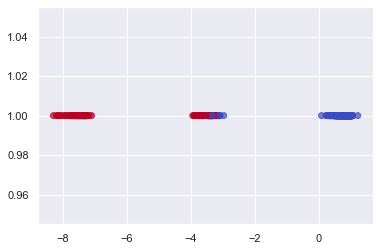

In [51]:
plt.scatter(
    X_test,
    np.ones_like(X_test),
    c=y_pred,
    cmap='coolwarm',
    alpha=0.7
)

In [52]:
print(confusion_matrix(y_test, y_pred))
accuracy_score(y_test, y_pred)

[[1120   21]
 [   5  119]]


0.9794466403162055

    The K-Nearest Neighbours prediction using euclidean distance is displayed by the confusion matrix as 1,239 divided by 1265, which results in a 98% accuracy score. As expected, the results are similar to the previous method.

## Decision Tree

    Another supervised method, decision tree method combines a sequence of straightforward techniques, in which each one makes use of a threshold value as a metric against possible values, this method classifies the data that fall in a particular region as integrated to the most recurrent class in that region. The decision tree's main goal is to depict a tree with its findings data patterns accomplished by checking which test best separate the different cases into classes (Kotsiantis, 2011).

In [53]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier

# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [54]:
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9731225296442688


    The model evaluation resulted in an accuracy of over 97%, extremely good accuracy and similar to the models previously applied (Navlani, 2018).

## Comparison of ML algorithms for Classification  

    Every single supervised algorithm resulted in an outstanding performance,  Random Forest Classification, K-Nearest Neighbours and Decision Tree resulted in an accuracy score of over 97%, with minor differences between them. K-Nearest Neighbours had the best accuracy score, however, the difference is negligible, it is safe to say that the predictions of all three methods are suitable.

# Clustering algorithms

    Clustering is a valuable set of methods used in many applications, these unsupervised algorithms divide the features into classes, this division is based on data patterns identified by the algorithm, and the objects are grouped on the defined class based on similar behaviour (Dubey and Choubey, 2017). For the following algorithms the also unsupervised PCA scaled data will be applied, the reason is that the scaled data still have a high performance, even though being lower compared to the other methods, but the sparse distribution of the components contributes to better visualization.

## K-Means Clustering

    This clustering algorithm is the most widely employed, the goal of K-Means unsupervised technique is to partition the observations into k clusters so the observations can be grouped based on the closest mean (Dubey and Choubey, 2017).

Text(0, 0.5, 'WCSS')

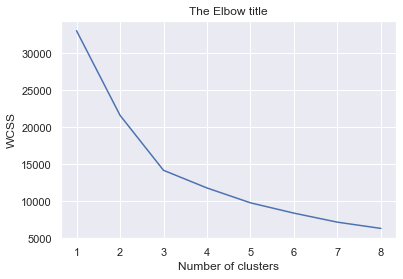

In [55]:
from sklearn.cluster import KMeans
wcss=[]

for i in range(1,9):
    kmeans = KMeans(i)
    kmeans.fit(X_r_s)
    wcss_iter = kmeans.inertia_
    wcss.append(wcss_iter)

number_clusters = range(1,9)
plt.plot(number_clusters,wcss)
plt.title('The Elbow title')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

    The relationship between Within Cluster Sum of Squares (WCSS) and the total clusters is depicted in the graph above, the result suggests the ideal number of clusters as 3, which is the WCSS changes start to level off (Maklin, 2019).

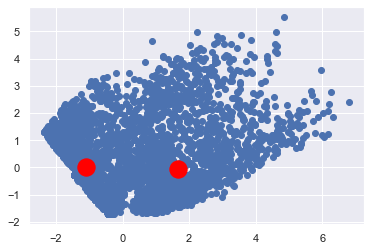

In [56]:
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_r_s)
plt.scatter(X_r_s[:,0], X_r_s[:,1])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()


    As with any unsupervised method, the k-means observe patterns on the data not considering the labels that the pattern was observed in the previous analysis, considering that forcing two centroids in the model results in a graph that does not capture the same results previously obtained. This may happen because the normal observations, which are the vast majority, behave in two different patterns, while abnormal observations behave in a single way.

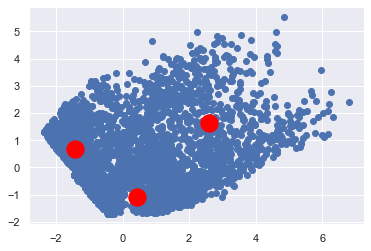

In [57]:
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X_r_s)
plt.scatter(X_r_s[:,0], X_r_s[:,1])
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
plt.show()

    Similar to the pattern observed in the PCA section, setting three different clusters better identify the nature of the features related to normal and abnormal observations. Both centroids in the down-left corner as normal observation clusters with different patterns within them, and the last cluster is the one that represents abnormal behaviour.

## Hierarchical Agglomerative Clustering

     As with other multivariate methods, the implemented hierarchical agglomerative clustering algorithm is an essential tool for the embedded classification of numerical features using sets of variables. This method is usually applied when the data has a large number of partitions each one correlated with a level of the hierarchyb(Murtagh and Contreras, 2017).

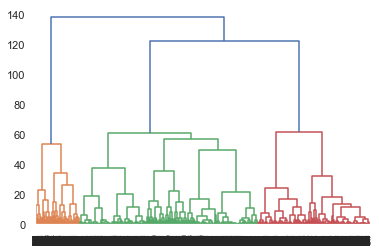

In [58]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(X_r_s, method='ward'))

    The dendrogram graphic representation above represents the number of partitions within the data. As observed, the ideal number of clusters is also three, as obtained in the k-means section, this is noticeable by inspecting the vertical axis (Maklin, 2019).

In [59]:
model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
model.fit(X_r_s)
labels = model.labels_

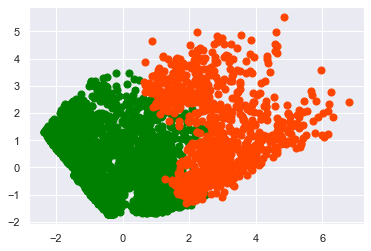

In [60]:
plt.scatter(X_r_s[labels==0, 0], X_r_s[labels==0, 1], s=50, marker='o', color='green')
plt.scatter(X_r_s[labels==1, 0], X_r_s[labels==1, 1], s=50, marker='o', color='orangered')

In [61]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
model.fit(X_r_s)
labels = model.labels_

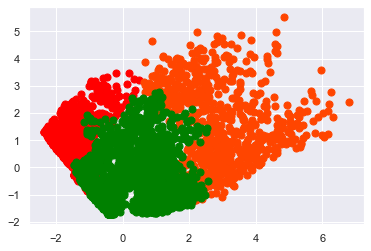

In [62]:
plt.scatter(X_r_s[labels==0, 0], X_r_s[labels==0, 1], s=50, marker='o', color='red')
plt.scatter(X_r_s[labels==1, 0], X_r_s[labels==1, 1], s=50, marker='o', color='orangered')
plt.scatter(X_r_s[labels==2, 0], X_r_s[labels==2, 1], s=50, marker='o', color='green')

    The scatter plot displays the separation of the clusters by colour, each colour associated with one class. The use of three clusters as indicated by the dendrogram exhibits a pattern similar that previously observed by other methods with outstanding precision (Maklin, 2019). 

## Comparison of ML algorithms for Clustering

    Both K-Means and Hierarchical Agglomerative Clustering exhibited similar results, indicating three patterns, being the normal data with two different patterns within itself and the abnormal data in a different third fashion, as suggested by the respective diagnostic plots. Both methods did an amazing job identifying and discriminating the different categories.

# Conclusion

    As a result of the comparison between scaled methods, it was observed that, except for the PCA, the standard scaling did not affect the result of the predictions, yet the scaling sparsed the data and allowed its observation to be better displayed in the diagnostic plots. Scaled PCA resulted in a more sparsed and two-dimensional plot, nevertheless, the LDA still had a better accuracy score when applied to random forest classification, being the method of choice for following classification algorithms.
    Three supervised algorithms were implemented for classification purposes, Random Forest, K-Nearest Neighbours and Decision Tree. Every single one of these algorithms resulted in an outstanding accuracy score, being excellent to make predictions for the normal and abnormal bidding behaviour, especially normal, because of the massive amount of observation that falls into this category. For the unsupervised algorithms, two clustering methods were applied using the scaled PCA data, K-Means Clustering and Hierarchical Agglomerative Clustering. It was observed in both algorithms clear division of the data into three distinct patterns, being two of them associated with normal bidding behaviour and one with abnormal.
    A Further step to improve the prediction power of these models for the detection of abnormal behaviour, that may be associated with scams and other unwanted conducts, could be adding more data with feature values associated with the abnormal bidding pattern observed in the algorithms implemented. Considering the results, it is conclusive that all implemented algorithms performed extremely well, specially K-nearest neighbours regression with feature reduced data by LDA.

# References

Alzahrani, A. and Sadaoui, S. (2018). Scraping and preprocessing commercial auction data for fraud classification. arXiv preprint [Web Link]. 

Analytics Vidhya. (2021). Tackling Missing Value in Dataset. [online] Available at: https://www.analyticsvidhya.com/blog/2021/10/handling-missing-value/#:~:text=Missing%20value%20can%20bias%20the [Accessed 28 Apr. 2022].

Asaithambi, S. (2017). Why, How and When to Scale your Features. [online] Medium. Available at: https://medium.com/greyatom/why-how-and-when-to-scale-your-features-4b30ab09db5e.

Askpython (2020). Split Training and Testing Data Sets in Python - AskPython. [online] Available at: https://www.askpython.com/python/examples/split-data-training-and-testing-set#:~:text=The%20most%20common%20split%20ratio [Accessed 19 May 2022].

BioTuring’s Blog. (2018). Dos and don’ts for a heatmap color scale. [online] Available at: https://blog.bioturing.com/2018/09/24/heatmap-color-scale/#:~:text=A%20simple%20color%20scale%20of.

Brownlee, J. (2020). Train-Test Split for Evaluating Machine Learning Algorithms. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/train-test-split-for-evaluating-machine-learning-algorithms/.

Capozzoli, A., Cerquitelli, T. and Piscitelli, M.S. (2016). Enhancing energy efficiency in buildings through innovative data analytics technologiesa. Pervasive Computing, pp.353–389.

Colour Blind Awareness (n.d.). Colour Blindness. [online] Colour Blind Awareness. Available at: https://www.colourblindawareness.org/colour-blindness/.

Dubey, A. and Choubey, A.P.D.A., 2017. A systematic review on k-means clustering techniques. Int J Sci Res Eng Technol (IJSRET, ISSN 2278–0882), 6(6).

Duvva, P. (2021). LDA vs. PCA – Towards AI. [online] Available at: https://towardsai.net/p/data-science/lda-vs-pca#:~:text=LDA%20focuses%20on%20finding%20a.

Galarnyk, M. (2017). PCA using Python (scikit-learn). [online] Medium. Available at: https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60.

Galarnyk, M. (2018). Understanding Boxplots. [online] Medium. Available at: https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51.

GeeksforGeeks. (2020). Normalization vs Standardization. [online] Available at: https://www.geeksforgeeks.org/normalization-vs-standardization/ [Accessed 1 May 2022].

Han, J., Kamber, M. and Pei, J. (2012). Introduction. Data Mining, pp.1–38.

Hunt, C. (2019). Why you shouldn’t use pie charts. [online] Statistical Consulting Centre. Available at: https://scc.ms.unimelb.edu.au/resources-list/data-visualisation-and-exploration/no_pie-charts#:~:text=Pies%20and%20doughnuts%20fail%20because [Accessed 27 Apr. 2022].

Jolliffe, I.T. and Cadima, J. (2016). Principal component analysis: a review and recent developments. Philosophical Transactions of the Royal Society A: Mathematical, Physical and Engineering Sciences, 374(2065), p.20150202. doi:10.1098/rsta.2015.0202.

Khurana, U., Samulowitz, H. and Turaga, D. (2018) “Feature Engineering for Predictive Modeling Using Reinforcement Learning”, Proceedings of the AAAI Conference on Artificial Intelligence, 32(1). Available at: https://ojs.aaai.org/index.php/AAAI/article/view/11678

Kohli, S. (2019). Understanding a Classification Report For Your Machine Learning Model. [online] Medium. Available at: https://medium.com/@kohlishivam5522/understanding-a-classification-report-for-your-machine-learning-model-88815e2ce397.

Kotsiantis, S.B. (2011). Decision trees: a recent overview. Artificial Intelligence Review, 39(4), pp.261–283. doi:10.1007/s10462-011-9272-4.

Kumar, S. (2020). 9 Reasons why Machine Learning models not perform well in production. [online] Medium. Available at: https://towardsdatascience.com/9-reasons-why-machine-learning-models-not-perform-well-in-production-4497d3e3e7a5 [Accessed 20 May 2022].

Navlani, A. (2018). Python Decision Tree Classification Tutorial: Scikit-Learn DecisionTreeClassifier. [online] Available at: https://www.datacamp.com/tutorial/decision-tree-classification-python [Accessed 16 May 2022].

Maklin, C. (2019). K-means Clustering Python Example. [online] Medium. Available at: https://towardsdatascience.com/machine-learning-algorithms-part-9-k-means-example-in-python-f2ad05ed5203.

More, A.S. and Rana, D.P. (2017). Review of random forest classification techniques to resolve data imbalance. 2017 1st International Conference on Intelligent Systems and Information Management (ICISIM). doi:10.1109/icisim.2017.8122151.

Murtagh, F. and Contreras, P. (2017). Algorithms for hierarchical clustering: an overview, II. Wiley Interdisciplinary Reviews: Data Mining and Knowledge Discovery, 7(6), p.e1219. doi:10.1002/widm.1219.

Ray, S. (2019). A Quick Review of Machine Learning Algorithms. [online] IEEE Xplore. doi:10.1109/COMITCon.2019.8862451.

Roy, B. (2020). All about Feature Scaling. [online] Medium. Available at: https://towardsdatascience.com/all-about-feature-scaling-bcc0ad75cb35.

scikit-learn.org. (n.d.). sklearn.discriminant_analysis.LinearDiscriminantAnalysis — scikit-learn 0.24.1 documentation. [online] Available at: https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html

Sen, P.C., Hajra, M. and Ghosh, M. (2019). Supervised Classification Algorithms in Machine Learning: A Survey and Review. Advances in Intelligent Systems and Computing, pp.99–111. doi:10.1007/978-981-13-7403-6_11.

Sharma, A. and Paliwal, K.K. (2014). Linear discriminant analysis for the small sample size problem: an overview. International Journal of Machine Learning and Cybernetics, 6(3), pp.443–454. doi:10.1007/s13042-013-0226-9.

Sullivan, J. (2018). Data Cleaning with Python and Pandas: Detecting Missing Values. [online] Medium. Available at: https://towardsdatascience.com/data-cleaning-with-python-and-pandas-detecting-missing-values-3e9c6ebcf78b.

Taunk, K., De, S., Verma, S. and Swetapadma, A. (2019). A Brief Review of Nearest Neighbor Algorithm for Learning and Classification. [online] IEEE Xplore. doi:10.1109/ICCS45141.2019.9065747.

Zach (2020). Linear Discriminant Analysis in Python (Step-by-Step). [online] Statology. Available at: https://www.statology.org/linear-discriminant-analysis-in-python/ [Accessed 11 May 2022].